<a href="https://colab.research.google.com/github/lubnaa25/Food_NF_Classification/blob/main/Finale.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*Food Non Food Challenge*

# Data Analysis

*Lets start by importing some libraries*

In [ ]:
import tensorflow as tf
import time
import shutil
import os

In [ ]:
#Since we're dealing with image files which are big files, GPU will be used for enhanced performance in terms of computations
#Using Kaggle IDE, GPU is integrated & has been activated
#Checking GPU Activation / Listing number of GPU
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print("Num GPUs Available: ", len(physical_devices))
#alerts can be ignored

Num GPUs Available:  1


2022-04-21 09:54:31.630881: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-21 09:54:31.712084: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-21 09:54:31.712821: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [ ]:
#display working dir
os.listdir('./')

['__notebook_source__.ipynb']

In [ ]:
#this is where the ds is stored
os.listdir('/kaggle/input/')

['foodnonfood']

In [ ]:
#importing important libs
import numpy as np #mathematical fn
import pandas as pd #data manipulation /analysis
import seaborn as sns #statistical data viz
sns.set_style('darkgrid') #this is used for styling seaborn plot

import glob #file/path retreival matching pattern
import matplotlib.pyplot as plt #ploting interface


In [ ]:
from tqdm import tqdm #tracking bar

from IPython.core.display import display, HTML #display is used to show images opened from path

from PIL import Image #To represent Python Imaging Lib Image
from sklearn.metrics import confusion_matrix, classification_report #evaluation stage
from tensorflow.keras.models import Model
import cv2


In [ ]:
#NOW let's verify class distribution
# NB: It is important to have a balanced / non-biased dataset  - to prevent model frombeing biased to majority class

train_image_names = glob.glob('../input/foodnonfood/TRAIN/TRAIN/*/*.jpg') #READING OF TRAINIiNG imgs from path
print("Total number of training images: ", len(train_image_names))

Total number of training images:  13113


In [ ]:
# make train_image_names as series object
train_image_names = pd.Series(train_image_names)
train_df = pd.DataFrame()

# generate Filename field
train_df['Filename'] = train_image_names.map(lambda img_name: img_name.split("/")[-1])

# generate ClassId field
train_df['ClassId'] = train_image_names.map(lambda img_name: (img_name.split("/")[-2]))
class_id_distribution = train_df['ClassId'].value_counts()
class_id_distribution



1    6709
0    6404
Name: ClassId, dtype: int64

we can already see that the data is not extremely unbanlanced - Food class is only slightly bigger but this is not really a problem because 
1. small batches are used (64 for training set since it is quite big)
2. During fitting (for tuned model) uniform distribution is used

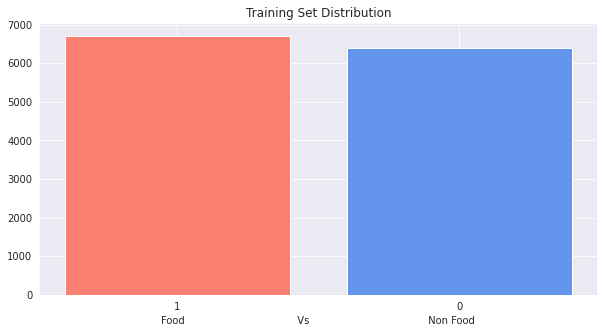

In [ ]:
#Now let's visualize the classes in the training; Here we see that the classes are almost balanced

plt.figure(figsize=(10,5))
plt.bar(class_id_distribution.index, class_id_distribution.values, color=['salmon','cornflowerblue'])
plt.title(label="Training Set Distribution")
plt.xlabel(('Food                                    Vs                                      Non Food'))
plt.show()       


A visualization is always better to represent the data and we see here too that the dataset is almost balanced - the gap is not huge

In [ ]:
#TEST dataset
test = glob.glob('../input/foodnonfood/TEST/TEST/*/*.jpg')
print("Total number of test images: ", len(test))

# make train_image_names as serie object
test = pd.Series(test)
testdf = pd.DataFrame()

# generate Filename field
testdf['Filename'] = test.map(lambda img_name: img_name.split("/")[-1])

# generate ClassId field
testdf['ClassId'] = test.map(lambda img_name: (img_name.split("/")[-2]))
class_id_distribution2 = testdf['ClassId'].value_counts()
class_id_distribution2

Total number of test images:  3279


1    1678
0    1601
Name: ClassId, dtype: int64

Even here you can see for the test set the data is not that skewed as such. It is ok for one class to be slightly more than an another (Brownlee, 2019)

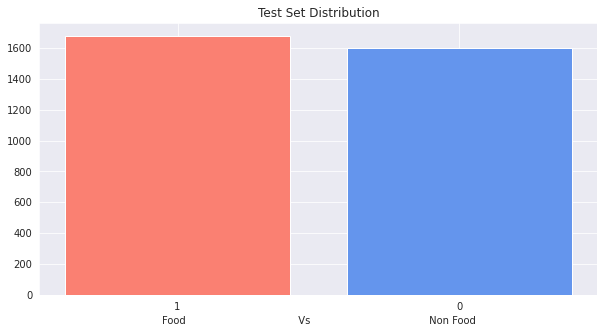

In [ ]:
plt.figure(figsize=(10,5))
plt.bar(class_id_distribution2.index, class_id_distribution2.values, color=['salmon','cornflowerblue'])
plt.title(label="Test Set Distribution")
plt.xlabel(('Food                                    Vs                                      Non Food'))
plt.show()

Now that the data distribution was checked, we saw that the data does not have high skew. Also, our data will be taken in random batches to ensure unbalanced data is not a problem

# Image Transformation (Augmentation)

In [ ]:

#Lets import some ML Libs

from tensorflow import keras #AI interface for TF Lib
# from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, GlobalAveragePooling2D, MaxPooling2D,BatchNormalization, Flatten #used in DL model layers
from tensorflow.keras.optimizers import Adam, Adamax, RMSprop #to optimize performance
from tensorflow.keras.metrics import categorical_crossentropy #Computes the crossentropy metric between the labels and predictions.
from tensorflow.keras import regularizers # Regularizers for applying penalties on layer parameters during optimization.
from tensorflow.keras.preprocessing.image import ImageDataGenerator #For generating image Batches (with augmentation)
from tensorflow.keras.models import Model, load_model, Sequential #seq to group layer stacks linearly into a Model (tf.keras.Model)
from tensorflow.keras.applications import imagenet_utils
from keras.callbacks import ModelCheckpoint, EarlyStopping

Data is augemented to randomly transform the images.
Note:
1. Augmentation replaces the original data with transformed data while using image Data generator  [(Rosebrock, 2019) ](https://pyimagesearch.com/2019/07/08/keras-imagedatagenerator-and-data-augmentation/)

In [ ]:
#as all data need to be pre-processed, here Data augmentation is used to produce favourable results
#Augmentation using ImageData Generator
train='../input/foodnonfood/TRAIN/TRAIN'
train_datagen = ImageDataGenerator(
        rescale=1./255, #to transform every pixel value from range [0,255] -> [0,1]
        shear_range=0.2, #randomly applying shear transformations - shifting pixels - changing the shape and size of the image accross the axes
        rotation_range=90,
        horizontal_flip=True,#flipping horizontally
        fill_mode='nearest')

In [ ]:
#a batch size of 32/64 is an optimum size - smaller batches are better for  stability (Brownlee,2019)
#reading the training images
training_set = train_datagen.flow_from_directory(
                    train,
                    target_size=(224, 224),
                    batch_size=64, #64 is chosen since the training set is quite huge
                    class_mode='binary') #1/0 - food/non-food

Found 13113 images belonging to 2 classes.


In [ ]:
#reading test img
test='../input/foodnonfood/TEST/TEST'
test_datagen=ImageDataGenerator(rescale=1./255)
testset=test_datagen.flow_from_directory(test,target_size=(224,224),batch_size=32,class_mode='binary')

Found 3279 images belonging to 2 classes.


Now that the data has been augmented, let's visualise the images in the DS

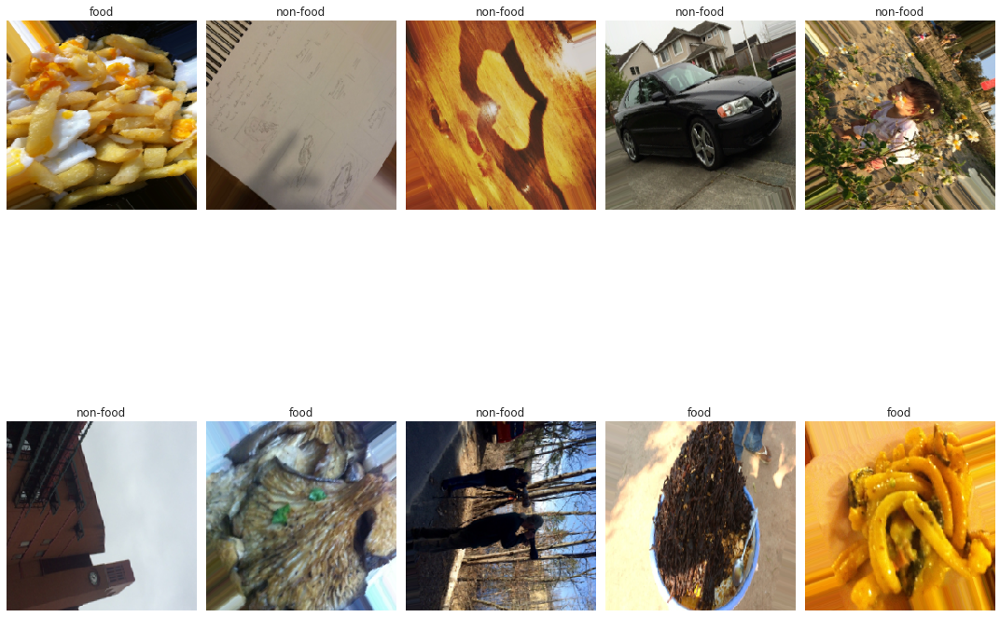

In [ ]:
#First let's visualize the Train set
plt.figure(figsize=(15, 15)) #image displayed in size 15X15
for i in range(0, 10):
    plt.subplot(2, 5, i+1) #2 rows with 5 images per row
    for X_batch, Y_batch in training_set:
        image = X_batch[0]        
        dic = {1:'food', 0:'non-food'} 
        plt.title(dic.get(Y_batch[0]))
        plt.axis('off')
        plt.imshow(np.squeeze(image),interpolation='nearest') # nearest will display an image without trying to interpolate between pixels since output display resolution != image resolution
        break
plt.tight_layout()
plt.show()

Images are of quite good quality

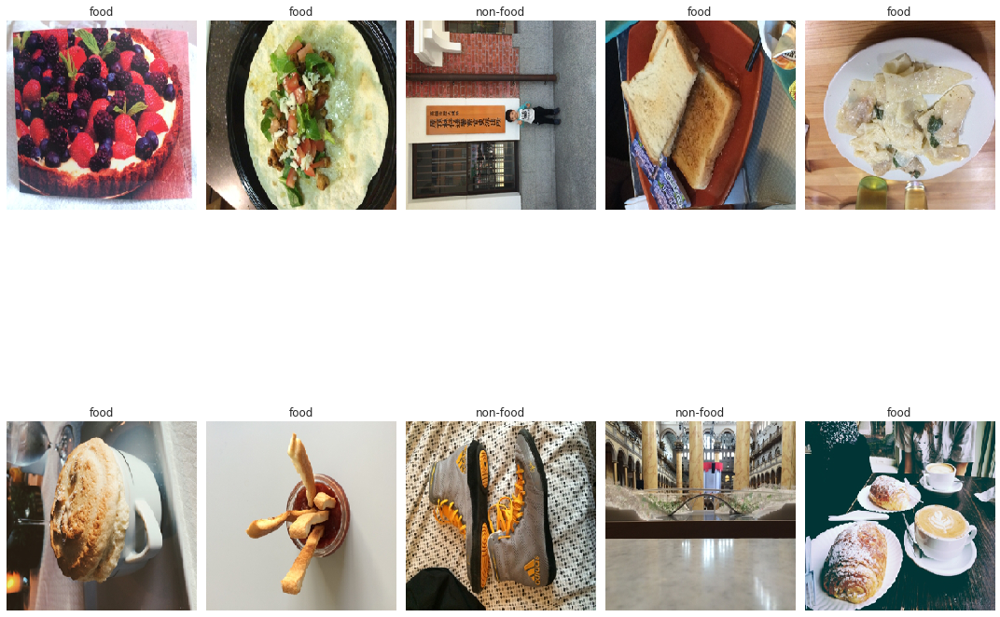

In [ ]:
#Let's visualize the testset

plt.figure(figsize=(15, 15)) #image displayed in size 15X15
for i in range(0, 10):
    plt.subplot(2, 5, i+1) #2 rows with 5 images per row
    for X_batch, Y_batch in testset:
        image = X_batch[0]        
        dic = {1:'food', 0:'non-food'} 
        plt.title(dic.get(Y_batch[0]))
        plt.axis('off')
        plt.imshow(np.squeeze(image),interpolation='nearest') # nearest will display an image without trying to interpolate between pixels since output display resolution != image resolution
        break
plt.tight_layout()
plt.show()

In [ ]:
#shape of the sets
print("training set shape is",training_set[-1])
print("test set shape is",testset[-1])

#verifying current image shapes
print("training images shape is",training_set.image_shape)
print("test images shape is",testset.image_shape)

training set shape is (array([], shape=(0, 224, 224, 3), dtype=float32), array([], dtype=float32))
test set shape is (array([], shape=(0, 224, 224, 3), dtype=float32), array([], dtype=float32))
training images shape is (224, 224, 3)
test images shape is (224, 224, 3)


# Model Building

A CNN model (model 1) was built for a dry run here

In [ ]:
#layers to be used in the CNN architecture
from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten, MaxPooling2D 

In [ ]:
model1= Sequential()
model1.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),activation='relu',input_shape=[224,224,3]))#images are RGB so last dimension is 3
model1.add(MaxPool2D(pool_size=2,strides=2))
model1.add(Conv2D(filters=64,kernel_size=(3,3),activation='relu'))
model1.add(MaxPool2D(pool_size=2,strides=2))
model1.add(Conv2D(filters=128,kernel_size=(3,3),activation='relu'))
model1.add(MaxPool2D(pool_size=2,strides=2))
model1.add(Conv2D(filters=256,kernel_size=(3,3),activation='relu'))
model1.add(Conv2D(filters=256,kernel_size=(3,3),activation='relu'))
model1.add(MaxPool2D(pool_size=2,strides=2))
model1.add(Conv2D(filters=512,kernel_size=(3,3),activation='relu'))
model1.add(Conv2D(filters=512,kernel_size=(3,3),activation='relu'))
model1.add(Conv2D(filters=512,kernel_size=(3,3),activation='relu'))
model1.add(MaxPool2D(pool_size=2,strides=2))
model1.add(Flatten())#Flattening is No brainer and it simply converts a multi-dimensional object to one-dimensional by re-arranging the elements.
model1.add(Dropout(0.2))
model1.add(Dense(units=512,activation='relu'))
model1.add(Dense(units=128,activation='relu'))
model1.add(Dense(units=64,activation='relu'))
model1.add(Dense(units=1,activation='sigmoid')) #only one output required

In [ ]:
# Metrics for model
METS = [
      
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.AUC(name='auc'),
]
#compiling model
#binary crossentropy used since this is binary classification model; output has only two classes
model1.compile(optimizer='SGD',loss='binary_crossentropy',metrics=['accuracy',METS])


In [ ]:

#let's see the shapes and parameters of each layer
model1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 52, 52, 128)       73856     
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 26, 26, 128)       0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 24, 24, 256)      

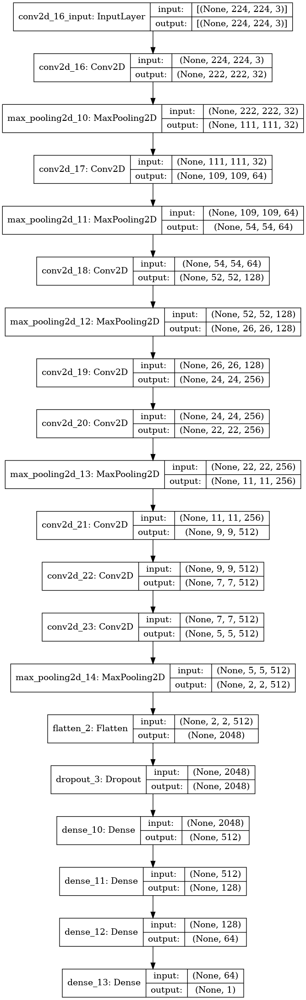

In [ ]:
#visually representing the model
#model Plotting 
from tensorflow.keras.utils import plot_model
plot_model(model1, show_shapes=True, show_layer_names=True, rankdir='TB', expand_nested=True)

 Fitting Model 1

In [ ]:
#lets begin the fitting of the first model
History = model1.fit(training_set,
                      validation_data=(testset),
                      epochs=25,
                      callbacks=[EarlyStopping(monitor='val_accuracy',patience=10)]) 
#Using early stopping so that if the validation accuracy does not increase 10X conscutively
#model is then stopped; i.e not all 25 epochs will be completed

Epoch 1/25
205/205 [==============================] - 179s 870ms/step - loss: 0.6897 - accuracy: 0.5832 - precision: 0.5790 - recall: 0.6798 - auc: 0.6305 - val_loss: 0.6825 - val_accuracy: 0.6465 - val_precision: 0.5977 - val_recall: 0.9464 - val_auc: 0.7774
Epoch 2/25
205/205 [==============================] - 178s 868ms/step - loss: 0.6522 - accuracy: 0.6995 - precision: 0.7084 - recall: 0.7014 - auc: 0.7504 - val_loss: 0.6499 - val_accuracy: 0.6200 - val_precision: 0.9186 - val_recall: 0.2825 - val_auc: 0.7842
Epoch 3/25
205/205 [==============================] - 179s 871ms/step - loss: 0.5488 - accuracy: 0.7347 - precision: 0.7563 - recall: 0.7102 - auc: 0.7946 - val_loss: 0.5092 - val_accuracy: 0.7502 - val_precision: 0.8831 - val_recall: 0.5900 - val_auc: 0.8739
Epoch 4/25
205/205 [==============================] - 177s 865ms/step - loss: 0.4978 - accuracy: 0.7625 - precision: 0.7704 - recall: 0.7633 - auc: 0.8387 - val_loss: 0.5203 - val_accuracy: 0.7402 - val_precision: 0.6648

Evaluating Model 1

In [ ]:
#*others used to catch other output being returned
#evaluation of trained model onto the test set
loss, acc, prec, recall, auc, *others = model1.evaluate(testset) 
acc

103/103 [==============================] - 11s 105ms/step - loss: 0.3026 - accuracy: 0.8737 - precision: 0.9270 - recall: 0.8176 - auc: 0.9541


0.8737419843673706

Model is showing promising results. Only 25 epochs were run and accuracy us 87.4%. However here a lower loss is desirable

**Let's Plot the iterations for Model 1 to get a better picture of the performance**

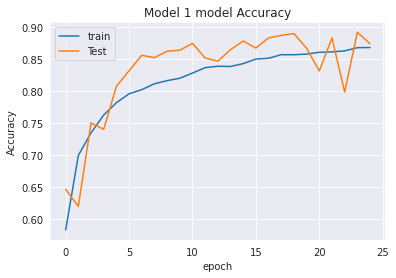

In [ ]:
#Plot Accuracy
plt.figure()
plt.plot(History.history['accuracy'])
plt.plot(History.history['val_accuracy'])
plt.title('Model 1 model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'Test'], loc='upper left')
plt.show()

The model is seemingly unstable with few sudden peaks. At instances, it is seen that the test accuracy is higher than training which may be a sign of overfitting and also here the distribution of the data was not specified. different batches can have different distributions. So this needs to be remedied

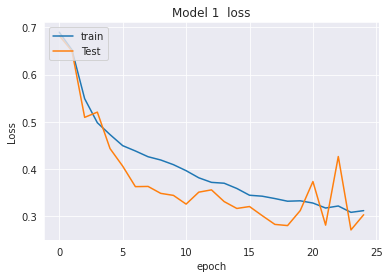

In [ ]:
#Plot LOSS

plt.figure()
plt.plot(History.history['loss'])
plt.plot(History.history['val_loss'])
plt.title('Model 1  loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train', 'Test'], loc='upper left')
plt.show()

While the lost decreases gradually for the training set but for the test set 
sudden peaks seem to be observed which relates to model stability 

# Building a second model


Here a few changes are going to take place:
1. Making model a bit more complex by adding one convolution layer --> Conv2D & Adding a Dense layer(filters=128,kernel_size=(3,3),activation='relu')
2. Adding a dropout before the flatten layer - to prevent overfit (increasing complexity tends to result in overfit so this is a way to prevent it)
3. Uniform distribution will be taken into consideration using kernel_intializer='he_uniform'
4. Change in optimizer; Adamax will be used
5. 

In [ ]:
Tuned= Sequential()#lets make the model more complex to prevent underfit
Tuned.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),activation='relu',input_shape=[224,224,3],kernel_initializer='he_uniform')) #he_uniform Draws samples from a uniform distribution (He et al.,2015)
Tuned.add(MaxPool2D(pool_size=2,strides=2))
Tuned.add(Conv2D(filters=64,kernel_size=(3,3),activation='relu'))
Tuned.add(MaxPool2D(pool_size=2,strides=2))
Tuned.add(Conv2D(filters=128,kernel_size=(3,3),activation='relu'))
Tuned.add(Conv2D(filters=128,kernel_size=(3,3),activation='relu')) #one conv layer added
Tuned.add(MaxPool2D(pool_size=2,strides=2))
Tuned.add(Conv2D(filters=256,kernel_size=(3,3),activation='relu'))
Tuned.add(Conv2D(filters=256,kernel_size=(3,3),activation='relu'))
Tuned.add(MaxPool2D(pool_size=2,strides=2))
Tuned.add(Conv2D(filters=512,kernel_size=(3,3),activation='relu'))
Tuned.add(Conv2D(filters=512,kernel_size=(3,3),activation='relu'))
Tuned.add(Conv2D(filters=512,kernel_size=(3,3),activation='relu'))
Tuned.add(MaxPool2D(pool_size=2,strides=2))
Tuned.add(Dropout(0.2)) #one dropout of 0.2 added
Tuned.add(Flatten())
Tuned.add(Dropout(0.2))
Tuned.add(Dense(units=1024,activation='relu')) #add one dense unit
Tuned.add(Dense(units=512,activation='relu'))
Tuned.add(Dense(units=128,activation='relu'))
Tuned.add(Dropout(0.2)) 
Tuned.add(Dense(units=64,activation='relu'))
Tuned.add(Dense(units=1,activation='sigmoid')) #only one output required

In [ ]:
#opt = RMSprop(learning_rate= 0.00001, momentum=0.8, epsilon=1e-07)  #changing optimizer & adjust learning rate #this was tried with no improvement

Tuned.compile(loss='binary_crossentropy',
              optimizer= 'Adamax',
              metrics=['accuracy',METS])

In [ ]:
Tuned.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_42 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 52, 52, 128)       73856     
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 50, 50, 128)       147584    
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 25, 25, 128)      

*How the parameters are calculated can be viewed in the final Report*

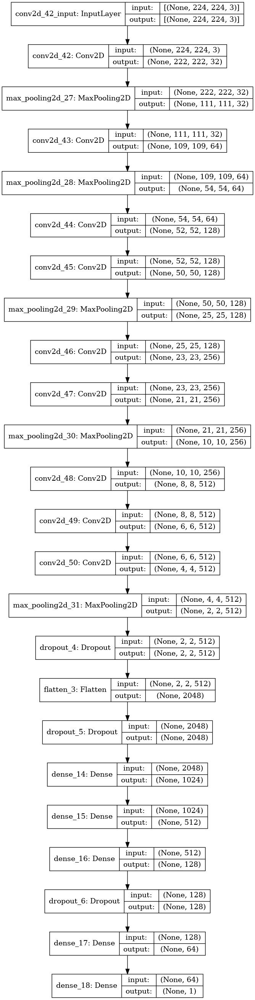

In [ ]:
plot_model(Tuned,show_shapes=True, show_layer_names=True, rankdir='TB', expand_nested=True)

# Fitting Second Model

In [ ]:
History2 = Tuned.fit(training_set,
                      validation_data=(testset),
                      epochs=100,#increase iterations
                      callbacks=[EarlyStopping(monitor='val_accuracy',patience=10)]) 
#Using early stopping so that if the validation accuracy does not increase 10X conscutively
#model is then stopped; i.e not all 100 epochs will be completed

Epoch 1/100
205/205 [==============================] - 181s 881ms/step - loss: 0.4836 - accuracy: 0.7811 - precision: 0.7781 - recall: 0.8004 - auc: 0.8555 - val_loss: 0.3753 - val_accuracy: 0.8475 - val_precision: 0.8600 - val_recall: 0.8385 - val_auc: 0.9175
Epoch 2/100
205/205 [==============================] - 178s 871ms/step - loss: 0.3763 - accuracy: 0.8421 - precision: 0.8414 - recall: 0.8518 - auc: 0.9139 - val_loss: 0.2966 - val_accuracy: 0.8814 - val_precision: 0.8754 - val_recall: 0.8957 - val_auc: 0.9484
Epoch 3/100
205/205 [==============================] - 180s 877ms/step - loss: 0.3111 - accuracy: 0.8723 - precision: 0.8790 - recall: 0.8702 - auc: 0.9409 - val_loss: 0.2781 - val_accuracy: 0.8911 - val_precision: 0.8746 - val_recall: 0.9190 - val_auc: 0.9542
Epoch 4/100
205/205 [==============================] - 179s 873ms/step - loss: 0.2814 - accuracy: 0.8845 - precision: 0.8869 - recall: 0.8875 - auc: 0.9519 - val_loss: 0.3154 - val_accuracy: 0.8631 - val_precision: 0.

A total of 42 epochs was completed even though the number was set to 100. This is because there was no improvement in the validation accuracy and this in place to also prevent overfit

# Evaluating second model

In [ ]:
loss_tuned, acc_tuned, prec_tune,rec_tuned, auc_tuned,*others = Tuned.evaluate(testset) 
acc_tuned

103/103 [==============================] - 11s 103ms/step - loss: 0.1776 - accuracy: 0.9323 - precision: 0.9596 - recall: 0.9058 - auc: 0.9824


0.9322964549064636

As you can see there has been an increase in the accuracy 

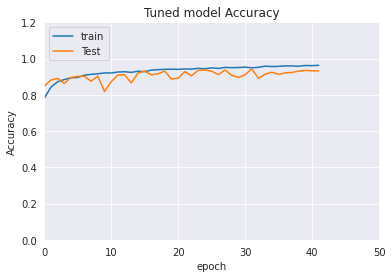

In [ ]:
#Plot Accuracy
plt.figure()
plt.plot(History2.history['accuracy'])
plt.plot(History2.history['val_accuracy'])
plt.title('Tuned model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'Test'], loc='upper left')
plt.xlim([0,50])
plt.ylim([0.0,1.2])
plt.show()

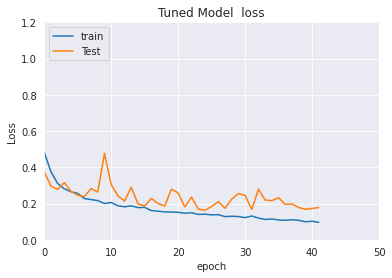

In [ ]:
#Plot LOSS

plt.figure()
plt.plot(History2.history['loss'])
plt.plot(History2.history['val_loss'])
plt.title('Tuned Model  loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train', 'Test'], loc='upper left')
plt.xlim([0,50])
plt.ylim([0.0,1.2])
plt.show()

# Compare the  2 models built

Some of the metrics used for evaluation has been shown here. Generally the model "Tuned" has had a better performance. We can see that the loss has decreased by 0.125 while the accuracy showed an increase of 5.56%. From these numbers it can be said that the better model is the "Tuned" one. But lets see how the latter performed in comparison to model 1 based on the iterations.

In [ ]:
print(("Old loss was: {0:.3f}".format(loss)), ("new loss is: {0:.3f}".format(loss_tuned)),("\nThere has been decrease of {0:.3f}".format(loss-loss_tuned)),"!!!" )

Old loss was: 0.303 new loss is: 0.178 
There has been decrease of 0.125 !!!


In [ ]:
print(("Old accuracy was: {:.2%}".format(accuracy)), ("new accuracy is: {:.2%}".format(acc_tuned)),("\nThere has been an increase of {:.2%}".format(acc_tuned-accuracy)),"!!!" )

Old accuracy was: 87.37% new accuracy is: 93.23% 
There has been an increase of 5.86% !!!


In [ ]:
print(("Old Precison score was: {0:.3f}.".format(precision)), (" New score is: {0:.3f}".format(prec_tune)),("\nThe precision score has show an increase of {0:.3f}".format(prec_tune-precision)),"!!!" )

Old Precison score was: 0.927.  New score is: 0.960 
The precision score has show an increase of 0.033 !!!


In [ ]:
print(("Old recall score was: {0:.3f}.".format(recall)), (" New recall score is: {0:.3f}".format(rec_tuned)),("\nThe precision score has show an increase of {0:.3f}".format(rec_tuned-recall)),"!!!" )

Old recall score was: 0.818.  New recall score is: 0.906 
The precision score has show an increase of 0.088 !!!


In [ ]:
print(("Old AUC was: {:.2%}".format(auc)), ("new AUC is: {:.2%}".format(auc_tuned)),("\nThere has been an increase of {:.2%}".format(auc_tuned-auc)),"!!!" )

Old AUC was: 95.41% new AUC is: 98.24% 
There has been an increase of 2.83% !!!


**Let's Plot the models to get a better comparison**

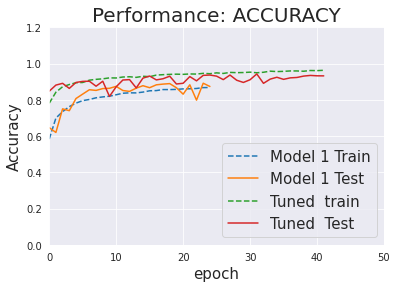

In [ ]:
#ACCURACY Evaluation

plt.figure()
plt.plot(History.history['accuracy'],label='Model 1 Train',linestyle='dashed')
plt.plot(History.history['val_accuracy'],label='Model 1 Test')
plt.plot(History2.history['accuracy'],label='Tuned  train',linestyle='dashed')
plt.plot(History2.history['val_accuracy'],label='Tuned  Test')
plt.title('Performance: ACCURACY',fontsize=20)
plt.ylabel('Accuracy',fontsize=15)
plt.xlabel('epoch',fontsize=15)
plt.legend( loc='lower right',fontsize=15)
plt.xlim([0,50])
plt.ylim([0.0,1.2])
plt.rcParams['figure.figsize'] = [15, 15]
plt.show()

From the Accuracy Plot, it is seen that the Tuned model's training even started with a superior accuracy as opposed to model one.\
For the validation on the test set of the tuned model, while initially it started underfitting it started to generalize and even though there has been quite a stable performance after epoch=35

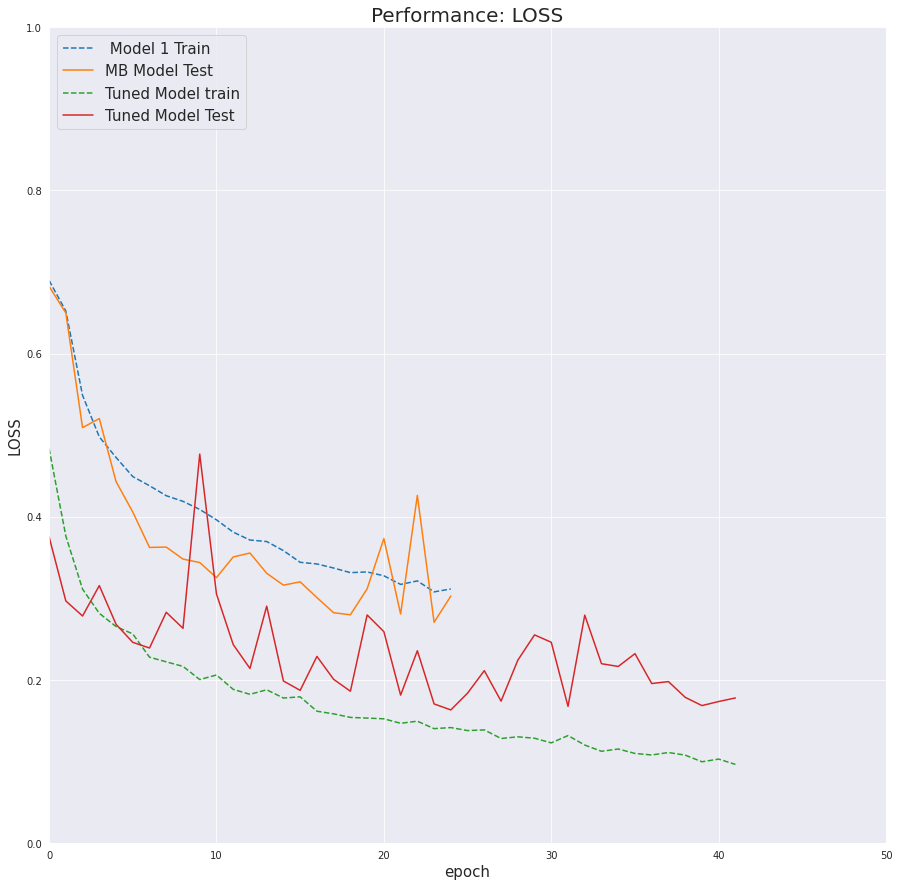

In [ ]:
#LOSS Evaluation

plt.figure()
plt.plot(History.history['loss'],label=' Model 1 Train',linestyle='dashed')
plt.plot(History.history['val_loss'],label='MB Model Test')
plt.plot(History2.history['loss'],label='Tuned Model train',linestyle='dashed')
plt.plot(History2.history['val_loss'],label='Tuned Model Test')
plt.title('Performance: LOSS',fontsize=20)
plt.ylabel('LOSS',fontsize=15)
plt.xlabel('epoch',fontsize=15)
plt.legend( loc='upper left',fontsize=15)
plt.xlim([0,50])
plt.ylim([0.0,1.00])
plt.rcParams['figure.figsize'] = [8, 8]
plt.show()

While looking at the loss plot the tuned model's loss is much lower compared to model 1. Here there are quite few peaks in the loss but this can be due to the fact that at different epochs different batches of the test set is being used. The model stops fitting since acc does not improve after epoch 32. This is done to prevent overfitting

# Prediction

In [ ]:
Prediction=Tuned.predict(testset,verbose=1)

103/103 [==============================] - 10s 100ms/step


View the distribution of predictions

In [ ]:
import scipy
bins = [0.0,0.2,0.4,0.6,0.8,1.0]
mn, std = scipy.stats.norm.fit(Prediction)

In [ ]:
print("Mean of predictions= ",mn)

Mean of predictions=  0.48130235


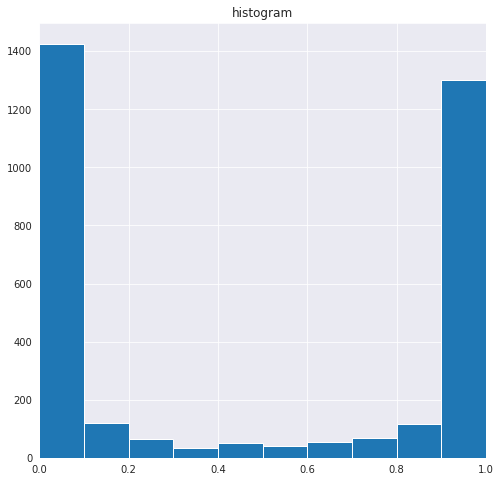

In [ ]:
plt.hist(Prediction,[0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.title("histogram") 
plt.xlim([0,1])
plt.show()

Lets vizsualize The images and corresponding predictions. Here the cutoff value has been chosen based on the distributions of the predictions. Usually when there is a binary classifcation the cutoff val is 0.5 (midpoint 0-1). Here after verifying the mean the cutoff of 0.5 is chosen as well

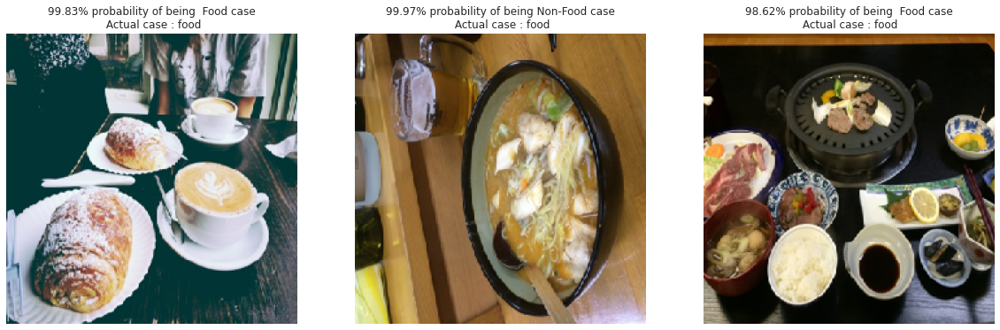

In [ ]:
plt.figure(figsize=(20,20))
for i in range(0+0,3+0):
  plt.subplot(1, 3, (i-0)+1)
  if Prediction[i, 0] >= 0.5: #0.5 can be a good cutoff val based on mean of preds
      out = ('{:.2%} probability of being  Food case'.format(Prediction[i][0]))
      
      
  else: 
      out = ('{:.2%} probability of being Non-Food case'.format(1-Prediction[i][0]))
      
      

  plt.title(out+"\n Actual case : "+ dic.get(Y_batch[i]))    
  plt.imshow(np.squeeze(X_batch[i]))
  plt.axis('off')
plt.show()

Here we can see that out of the three predictions plotted, which were all Food cases, the model incorrectly classified the 2nd picture as non food and that too with a high probability.


But why does the model classifies some correctly and others not - even though they all clearly look like food.


**To understand how the model is actually doing the predictions on the images,  gradcams come in handy to show where exactly the is looking** : this will be looked at in the last section of GRAD-CAM

In [ ]:
#to prevent re-shuffling ok the sequence of the test set
testset.reset()
x=np.concatenate([testset.next()[0] for i in range(testset.__len__())])
y=np.concatenate([testset.next()[1] for i in range(testset.__len__())])
print(x.shape)
print(y.shape)

(3279, 224, 224, 3)
(3279,)


In [ ]:
predictions = Prediction
predictions[predictions <= 0.5] = 0
predictions[predictions > 0.5] = 1

In [ ]:
print(classification_report(y_true=y,y_pred=predictions,target_names =['NONFOOD','FOOD']))
#the classification report shows the metrics of accuracy precision recall and f1score which can be helpful

              precision    recall  f1-score   support

     NONFOOD       0.91      0.96      0.93      1601
        FOOD       0.96      0.91      0.93      1678

    accuracy                           0.93      3279
   macro avg       0.93      0.93      0.93      3279
weighted avg       0.93      0.93      0.93      3279



Now let's see the number of correct and incorrect predictions; This will be useful to calculate the TPR,TNR, FPR, FNR to further evaluate the model 

<AxesSubplot:>

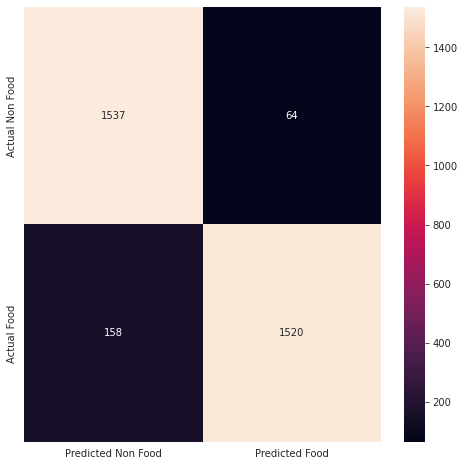

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
cm = pd.DataFrame(data=confusion_matrix(y, predictions, labels=[0, 1]),index=["Actual Non Food", "Actual Food"],
columns=["Predicted Non Food", "Predicted Food"])
sns.heatmap(cm,annot=True,fmt="d")


It can be seen here that the model classifies non-food a bit better compared to food. This will be explained in the report

# Applying GRAD-CAM

Now let's start trying to understand where the model is actually looking to make the predictions

In [ ]:
Tuned.summary() #to see the name of the last conv layer - we want to see the grad cam at the final layer only


Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_42 (Conv2D)           (None, 222, 222, 32)      896       
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 111, 111, 32)      0         
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 109, 109, 64)      18496     
_________________________________________________________________
max_pooling2d_28 (MaxPooling (None, 54, 54, 64)        0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 52, 52, 128)       73856     
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 50, 50, 128)       147584    
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 25, 25, 128)      

In [ ]:
last_layer='conv2d_50' #name of the last conv layer 

In [ ]:


def GradCam(model, imarr, layer_name, epsil=1e-8): #epsil value def #
    

    gMod = Model(
			inputs=[model.inputs],
			outputs=[model.get_layer(layer_name).output,
				model.output])
    
    with tf.GradientTape() as tape: #finding out the gradients at the last conv layer of the model
      inputs = tf.cast(imarr, tf.float32) #image array is in shape (x,y) - like in our case the image array passed will be (224,224)
      (convOutputs, predictions) = gMod(inputs) #The model has inputs which is outputed into convolution outputs and the predictions 
      loss = predictions[:, 0]
    gradientss = tape.gradient(loss, convOutputs) #the loss of the of the index of the class. diferentiation is then used for calculating the gradient
    
    csCNVOut = tf.cast(convOutputs > 0, "float32") #cast output to float
    csgradie = tf.cast(gradientss > 0, "float32") #cast gradient to float
    guidedgradientss =  csgradie * gradientss * csCNVOut #making guided gradients to highlight important regions

    
    guidedgradientss = guidedgradientss[0] #keep the batch of the guided gradients
    convOutputs = convOutputs[0] #keep the batch of the convolution outputs 

    wgts = tf.reduce_mean(guidedgradientss, axis=(0, 1))#average values

    gdcam = tf.reduce_sum(tf.multiply(wgts, convOutputs), axis=-1) #take into consideration the weights
    (wid, hei) = (imarr.shape[2], imarr.shape[1])

    #resize the image & normalize it & return it
    hm = cv2.resize(gdcam.numpy(), (wid, hei))
    numer = hm - np.min(hm)
    denom = (hm.max() - hm.min()) + epsil
    hm = numer / denom
    return hm



In [ ]:
def sg(x, a, b, c):
    return c / (1 + np.exp(-a * (x-b)))



In [ ]:
def supimp(backgrd, gdcam, thresh, emphasize=False): #to make the superimposed image
    hm = cv2.resize(gdcam, (backgrd.shape[1], backgrd.shape[0]))
    if emphasize:
        hm = sg(hm, 50, thresh, 1)
    hm = np.uint8(255 * hm)
    hm = cv2.applyColorMap(hm, cv2.COLORMAP_JET)

   #scaling is done and color RGB is applied to image and returned
    supimpd_img =  backgrd * 0.8 + hm * 0.8 (background + heatmap)
    supimpd_img = np.minimum(supimpd_img, 255.0).astype(np.uint8)    
    supimpd_img_rgb = cv2.cvtColor(supimpd_img, cv2.COLOR_BGR2RGB)
    #supimpd_img_rgb = supimpd_img
    return supimpd_img_rgb

In [ ]:
j=5

In [ ]:
MR=X_batch[j]

In [ ]:
MR.shape

(224, 224, 3)

In [ ]:
MRre = cv2.resize(MR,(224,224))     # resize image to match model's expected sizing
MRre = np.reshape(MRre,[1,224,224,3]) 

In [ ]:
MRre.shape

(1, 224, 224, 3)

In [ ]:
predtionNF=Tuned.predict(MRre)

In [ ]:
predtionNF

array([[0.999972]], dtype=float32)

Predicted Class is FOOD
Actual Classfood


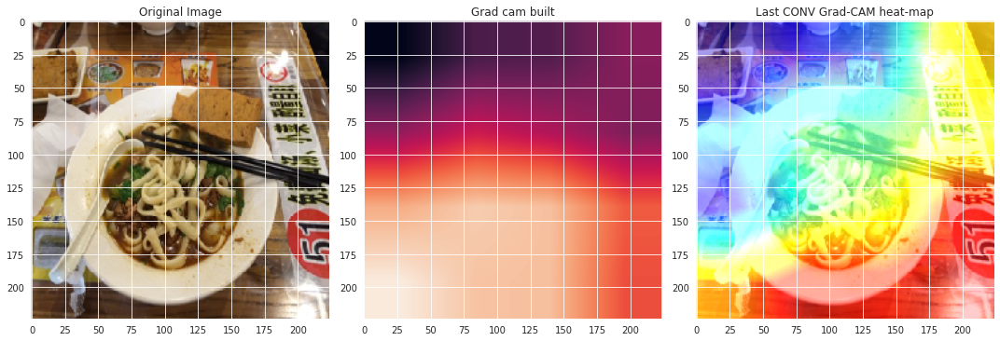

In [ ]:
if (predtionNF>=0.5):
    print('Predicted Class is FOOD')
    print('Actual Class'+dic.get(Y_batch[j]))
    
else:
    print('Predicted Class is Non-FOOD')
    print('Actual Class',dic.get(Y_batch[j]))
    




grad_cam3=GradCam(Tuned,MRre,last_layer)
plt.imsave('./noods.png', MR)
img_path='./noods.png'
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
    #grad_cam_supimpd3 = supimp(MR, grad_cam3, 0.5, emphasize=False)

plt.figure(figsize=(15, 15))
ax = plt.subplot(1, 3, 1)
plt.imshow(MR)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam3)
#plt.axis('off')
plt.title('Grad cam built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

You can see that the food part is actually being highlighted. Even though it is not fully exactly on the middle where the food (like border of plat is also highlighted) but the model is looking at the correct place. You can see the back of the picture is being ignored (black color in middle image, blue color in last image)

In [ ]:
k=3
MR2=X_batch[k]

In [ ]:
MRre2 = cv2.resize(MR2,(224,224))     # resize image to match model's expected sizing
MRre2 = np.reshape(MRre2,[1,224,224,3]) 
predtionNF2=Tuned.predict(MRre2)

In [ ]:
predtionNF2

array([[0.00436986]], dtype=float32)

Predicted Class is NON FOOD
Actual Class is  non-food


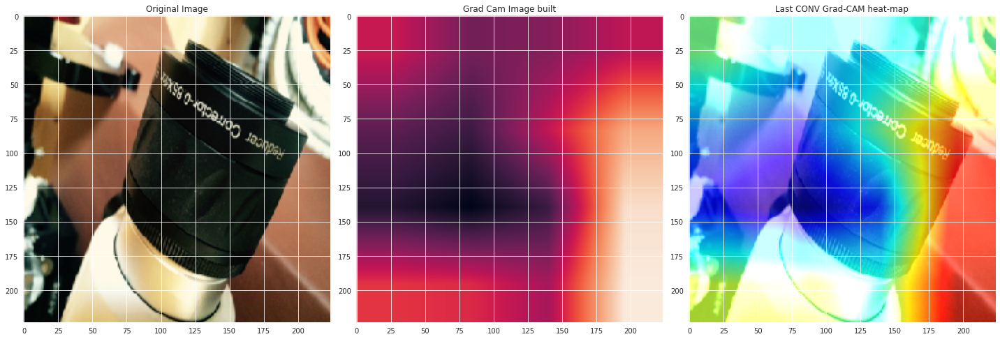

In [ ]:
if (predtionNF2>=0.5):
    print('Predicted Class is FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))
    
else:
    print('Predicted Class is NON FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))
    



grad_cam443=GradCam(Tuned,MRre2,last_layer)
plt.imsave('./came.png', MR2)
img_path='./came.png'
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(MR2)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
#plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

This is an example of a non food case. The parts not looked at are in black in second image, and in blue in the third image. Parts being looked at where its detecting the nonfood is being highlighted in the reds, yellow,green parts

In [ ]:
k=15
MR2=X_batch[k]

In [ ]:
MRre2 = cv2.resize(MR2,(224,224))     # resize image to match model's expected sizing
MRre2 = np.reshape(MRre2,[1,224,224,3]) 
predtionNF2=Tuned.predict(MRre2)

In [ ]:
predtionNF2

array([[8.2800354e-05]], dtype=float32)

Predicted Class is NON FOOD
Actual Class is  non-food


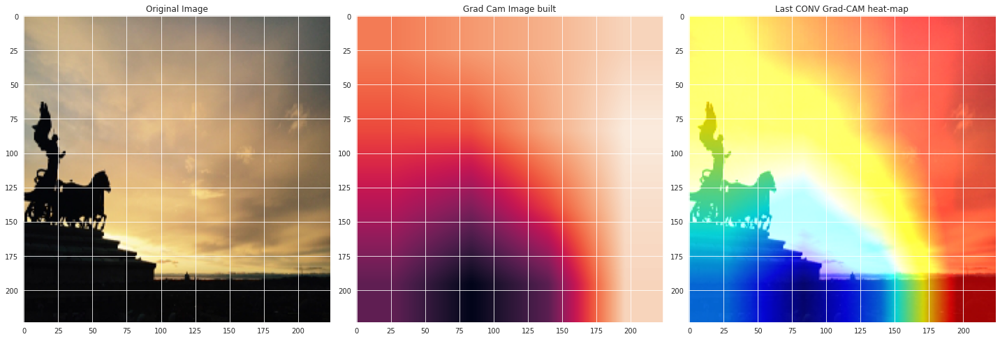

In [ ]:
if (predtionNF2>=0.5):
    print('Predicted Class is FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))
    
else:
    print('Predicted Class is NON FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))


grad_cam443=GradCam(Tuned,MRre2,last_layer)
plt.imsave('./cheval.png', MR2)
img_path='./cheval.png'
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
#grad_cam_supimpd3 = supimp(MR2, grad_cam443, 1.5, emphasize=False)

plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(MR2)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
#plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

Another case of non food which was correct classified where the red yellow and green parts are where the model is identifying the non food

Text(0.5, 1.0, 'food')

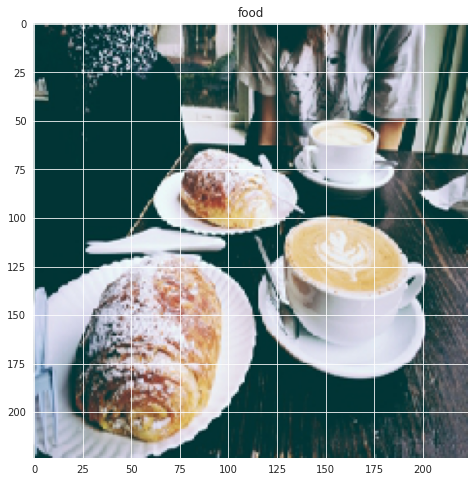

In [ ]:
NFD=0
plt.imshow(X_batch[NFD])
plt.title(dic.get(Y_batch[NFD]))

In [ ]:
img_array4=X_batch[NFD]
img3 = cv2.resize(img_array4,(224,224))     # resize image to match model's expected sizing
img3 = np.reshape(img_array4,[1,224,224,3]) 

In [ ]:
preNFD=Tuned.predict(img3)

In [ ]:
preNFD

array([[0.9997875]], dtype=float32)

Predicted Class is FOOD
99.98% probability of being  Food case
Actual Class is  food


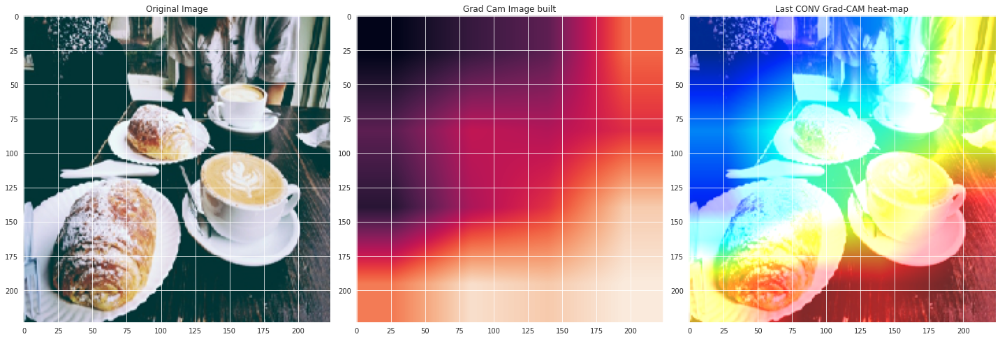

In [ ]:
if (preNFD>=0.5):
    print('Predicted Class is FOOD')
    print('{:.2%} probability of being  Food case'.format(preNFD[0][0]))
    print('Actual Class is ', dic.get(Y_batch[NFD]))
    
else:
    print('Predicted Class is NON FOOD')
    print('{:.2%} probability of being NON Food case'.format(1-preNFD[0][0]))
    print('Actual Class is ', dic.get(y[NFD]))


grad_cam443=GradCam(Tuned,img3,last_layer)
plt.imsave('./Painchoc.png', img_array4)
img_path='./Painchoc.png'
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
    #grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)

plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(img_array4)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
#plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

In [ ]:
FD=11
img_array3=x[FD]
img2 = cv2.resize(img_array3,(224,224))     # resize image to match model's expected sizing
img2 = np.reshape(img_array3,[1,224,224,3]) 
preFD=Tuned.predict(img2)

Predicted Class is NON FOOD
99.94% probability of being NON Food case
Actual Class is  non-food


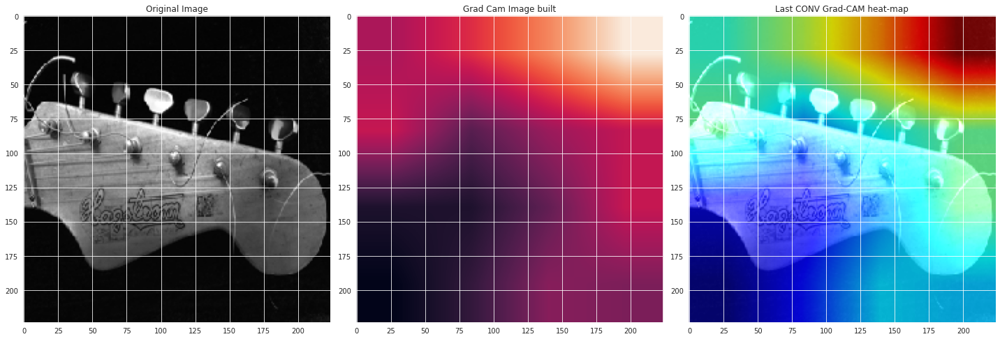

In [ ]:
if (preFD>=0.5):
    print('Predicted Class is FOOD')
    print('{:.2%} probability of being  Food case'.format(preFD[0][0]))
    print('Actual Class is ', dic.get(y[FD]))
    
else:
    print('Predicted Class is NON FOOD')
    print('{:.2%} probability of being NON Food case'.format(1-preFD[0][0]))
    print('Actual Class is ', dic.get(y[FD]))
  

grad_cam443=GradCam(Tuned,img2,last_layer)
plt.imsave('./Guitare.png', img_array3)
img_path='./Guitare.png'
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)

plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(img_array3)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
#plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

In [ ]:
j=5

In [ ]:
MR=X_batch[j]

In [ ]:
MRre = cv2.resize(MR,(224,224))     # resize image to match model's expected sizing
MRre = np.reshape(MRre,[1,224,224,3]) 

In [ ]:
predtionNF=Tuned.predict(MRre)

Predicted Class is Non-FOOD
Actual Class non-food


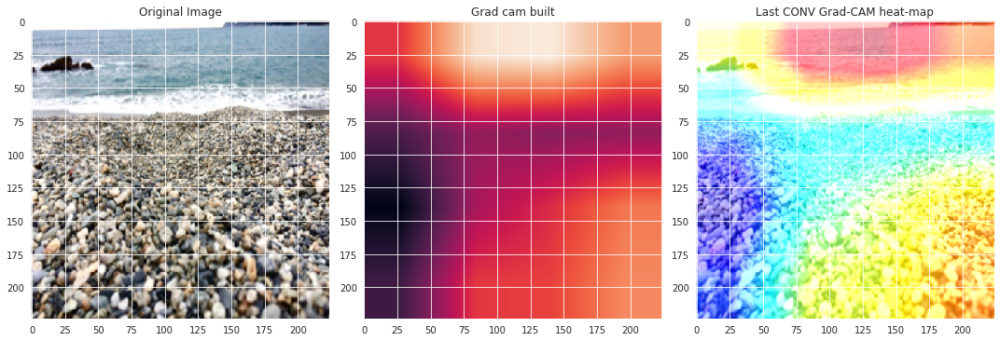

In [ ]:
if (predtionNF>=0.5):
    print('Predicted Class is FOOD')
    print('Actual Class'+dic.get(Y_batch[j]))
    
else:
    print('Predicted Class is Non-FOOD')
    print('Actual Class',dic.get(Y_batch[j]))
   
   
   
grad_cam3=GradCam(Tuned,MRre,last_layer)
plt.imsave('./mer.png', MR)
img_path='./mer.png'
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam3, 1.0, emphasize=False)

plt.figure(figsize=(15, 15))
ax = plt.subplot(1, 3, 1)
plt.imshow(MR)
#plt.axis('off')
plt.title('Original Image',)
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam3)
#plt.axis('off')
plt.title('Grad cam built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

In [ ]:
k=3
MR2=X_batch[k]

In [ ]:
MRre2 = cv2.resize(MR2,(224,224))     # resize image to match model's expected sizing
MRre2 = np.reshape(MRre2,[1,224,224,3]) 
predtionNF2=Tuned.predict(MRre2)

Predicted Class is NON FOOD
Actual Class is  non-food


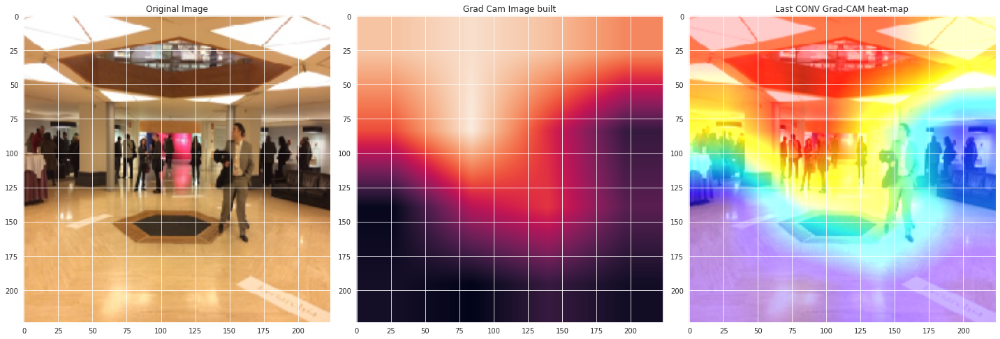

In [ ]:
if (predtionNF2>=0.5):
    print('Predicted Class is FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))
    
else:
    print('Predicted Class is NON FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))
  
  
grad_cam443=GradCam(Tuned,MRre2,last_layer)
plt.imsave('./man.png', MR2)
img_path='./man.png'
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(MR2)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
#plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

In [ ]:
k=2
MR2=X_batch[k]

In [ ]:
MRre2 = cv2.resize(MR2,(224,224))     # resize image to match model's expected sizing
MRre2 = np.reshape(MRre2,[1,224,224,3]) 
predtionNF2=Tuned.predict(MRre2)

Predicted Class is FOOD
Actual Class is  food


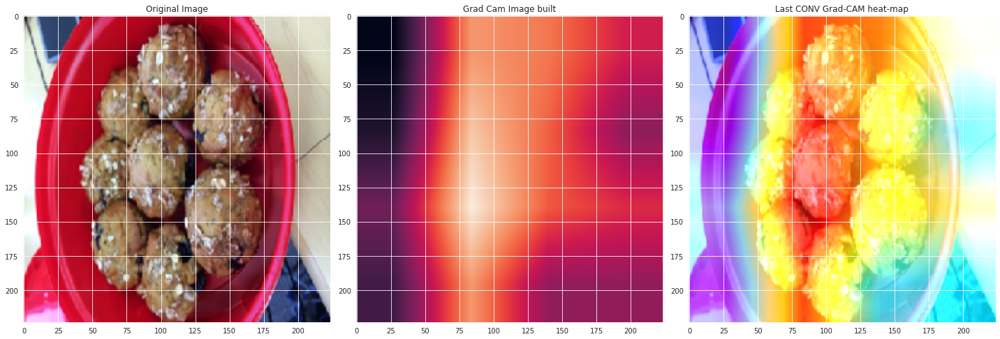

In [ ]:
if (predtionNF2>=0.5):
    print('Predicted Class is FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))
    
else:
    print('Predicted Class is NON FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))



grad_cam443=GradCam(Tuned,MRre2,last_layer)
plt.imsave('./galette.png', MR2)
img_path='./galette.png'
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
    

plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(MR2)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
#plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

In this picture you can see that the model is looking in the middle of the bowl ddirectly at the food. Which shows that the model is looking properly

In [ ]:
FD=12
plt.imshow(X_batch[FD])


In [ ]:
img_array3=X_batch[FD]
img2 = cv2.resize(img_array3,(224,224))     # resize image to match model's expected sizing
img2 = np.reshape(img_array3,[1,224,224,3]) 

In [ ]:
preFD=Tuned.predict(img2)

Predicted Class is NON FOOD
56.69% probability of being NON Food case
Actual Class is  food


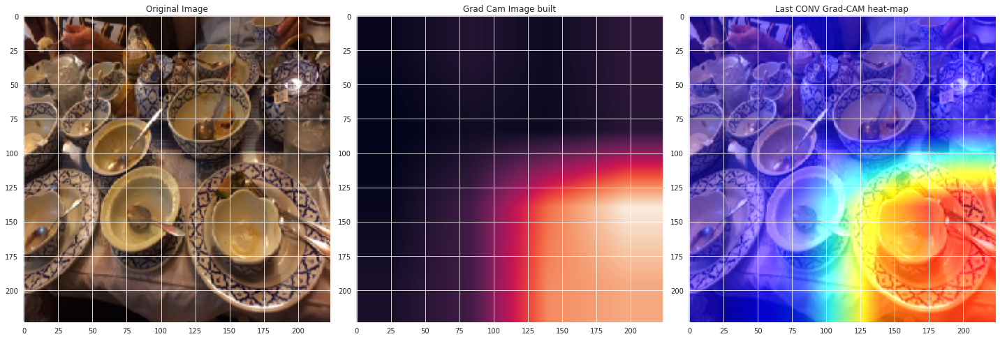

In [ ]:
if (preFD>=0.5):
    print('Predicted Class is FOOD')
    print('{:.2%} probability of being  Food case'.format(preFD[0][0]))
    print('Actual Class is ', dic.get(Y_batch[FD]))
    
else:
    print('Predicted Class is NON FOOD')
    print('{:.2%} probability of being NON Food case'.format(1-preFD[0][0]))
    print('Actual Class is ', dic.get(Y_batch[FD]))



grad_cam443=GradCam(Tuned,img2,last_layer)
plt.imsave('./plat.png', img_array3)
img_path='./plat.png'#in test set - 1 -> Image954.jpg
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)

plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(img_array3)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
#plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

This is a case incorrectly classified. In the test set this picture was labeled as food however the model says it is non-food. Now we see that the model is looking at the bottom corner of the picture only. And indeed there is no food in the bottom end. Only plate and bowl. So in this way the model might be correct. also in the image itself you can barely distinguish food

In [ ]:
k=30
MR2=X_batch[k]


MRre2 = cv2.resize(MR2,(224,224))     # resize image to match model's expected sizing
MRre2 = np.reshape(MRre2,[1,224,224,3]) 
predtionNF2=Tuned.predict(MRre2)

Predicted Class is FOOD
Actual Class is  food


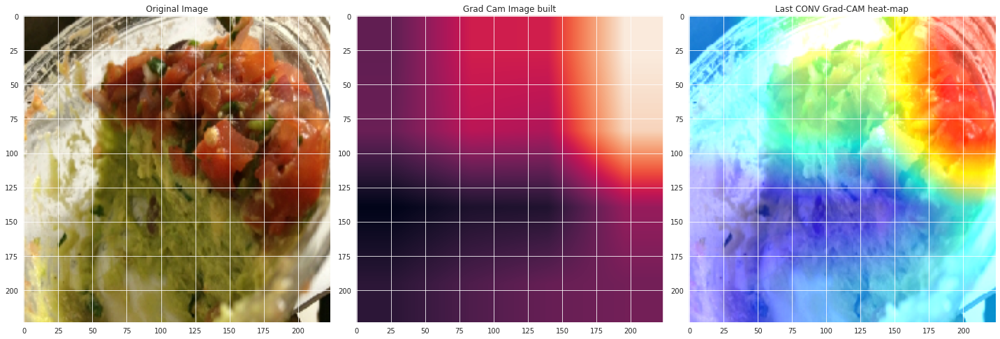

In [ ]:
if (predtionNF2>=0.5):
    print('Predicted Class is FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))
    
else:
    print('Predicted Class is NON FOOD')
    print('Actual Class is ', dic.get(Y_batch[k]))

grad_cam443=GradCam(Tuned,MRre2,last_layer)
plt.imsave('./pottage.png', MR2)
img_path='./pottage.png'
   
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(MR2)
#plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
#plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
#plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()


This is a case correctly classified. Here ewe see that the bowl is partly empty. and to identify the food the model is only looking at the half where food is actually present

In [ ]:
NFD=27
plt.imshow(X_batch[NFD])


In [ ]:
img_array4=X_batch[NFD]
img3 = cv2.resize(img_array4,(224,224))     # resize image to match model's expected sizing
img3 = np.reshape(img_array4,[1,224,224,3]) 

In [ ]:
preNFD=Tuned.predict(img3)

Predicted Class is FOOD
99.51% probability of being  Food case
Actual Class is  food


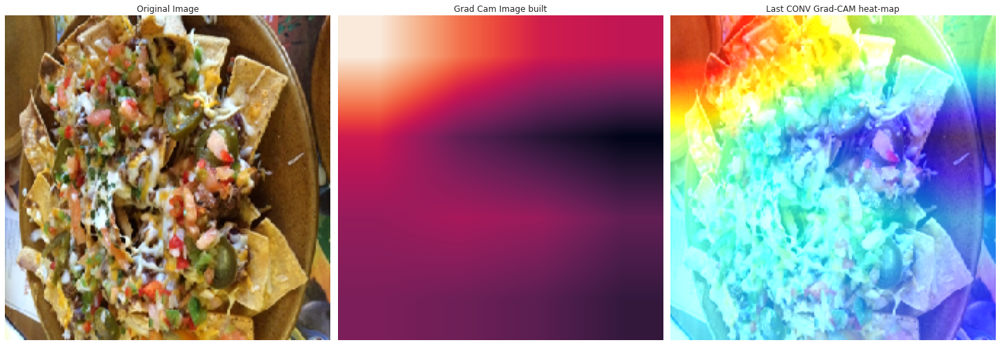

In [ ]:
if (preNFD>=0.5):
    print('Predicted Class is FOOD')
    print('{:.2%} probability of being  Food case'.format(preNFD[0][0]))
    print('Actual Class is ', dic.get(Y_batch[NFD]))
    
else:
    print('Predicted Class is NON FOOD')
    print('{:.2%} probability of being NON Food case'.format(1-preNFD[0][0]))
    print('Actual Class is ', dic.get(y[NFD]))
   
grad_cam443=GradCam(Tuned,img3,last_layer)
plt.imsave('./cafe.png', img_array4)
img_path=('./cafe.png')
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
    

plt.figure(figsize=(20, 20))
ax = plt.subplot(1, 3, 1)
plt.imshow(img_array4)
plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()    

In [ ]:
NFD=4

In [ ]:
img_array4=X_batch[NFD]
img3 = cv2.resize(img_array4,(224,224))     # resize image to match model's expected sizing
img3 = np.reshape(img_array4,[1,224,224,3]) 

In [ ]:
preNFD=Tuned.predict(img3)

Predicted Class is NON FOOD
96.71% probability of being NON Food case
Actual Class is  non-food


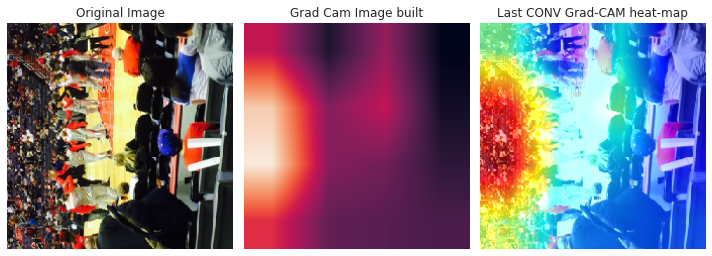

In [ ]:
if (preNFD>=0.5):
    print('Predicted Class is FOOD')
    print('{:.2%} probability of being  Food case'.format(preNFD[0][0]))
    print('Actual Class is ', dic.get(Y_batch[NFD]))
    
else:
    print('Predicted Class is NON FOOD')
    print('{:.2%} probability of being NON Food case'.format(1-preNFD[0][0]))
    print('Actual Class is ', dic.get(y[NFD]))
    
    
grad_cam443=GradCam(Tuned,img3,last_layer)
    
plt.imsave('./ball.png', img_array4)
img_path=('./ball.png')
img = cv2.imread(img_path)
img = cv2.resize(img,(224,224),3)
grad_cam_supimpd3 = supimp(img, grad_cam443, 1.0, emphasize=False)
plt.figure(figsize=(10, 10))
ax = plt.subplot(1, 3, 1)
plt.imshow(img_array4)
plt.axis('off')
plt.title('Original Image')
ax = plt.subplot(1, 3, 2)
plt.imshow(grad_cam443)
plt.axis('off')
plt.title('Grad Cam Image built')
ax = plt.subplot(1, 3, 3)
plt.imshow(grad_cam_supimpd3)
plt.axis('off')
plt.title('Last CONV Grad-CAM heat-map')
plt.tight_layout()

In [ ]:
#THE END

More Details in the report

# END 